# Sample 15arc-sec GEBCO_2023.nc on OM5 grid

## Apply edits to the topography.

## REGION= [[-30,0,-300,-220,],]

In [1]:
# Notebook editor: Brandon.Reichl

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [2]:
Region_Boundaries = [-30,0,-300,-220]
Region_Name = '08: Southeast Indian Ocean'

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


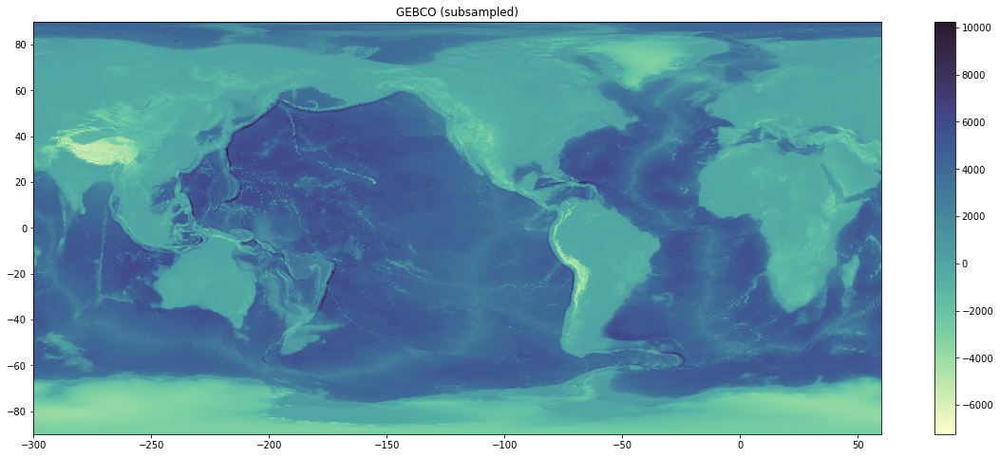

In [4]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

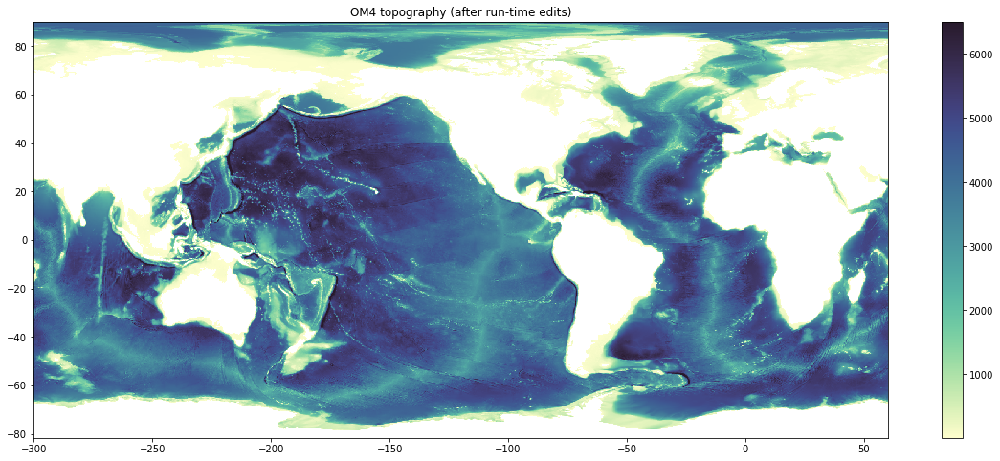

In [5]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');

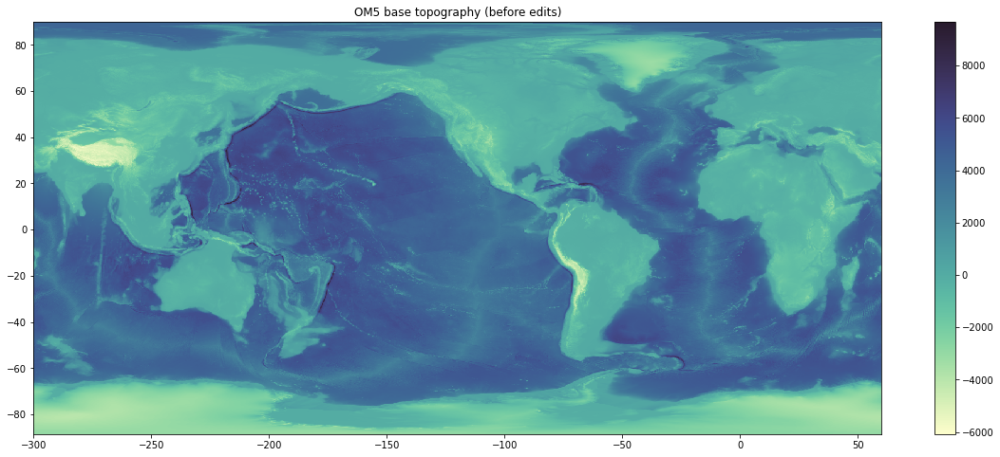

In [6]:
OM5 = OM5_data('ocean_hgrid.nc',
               'regridded_source_topog.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM5 base topography (before edits)');

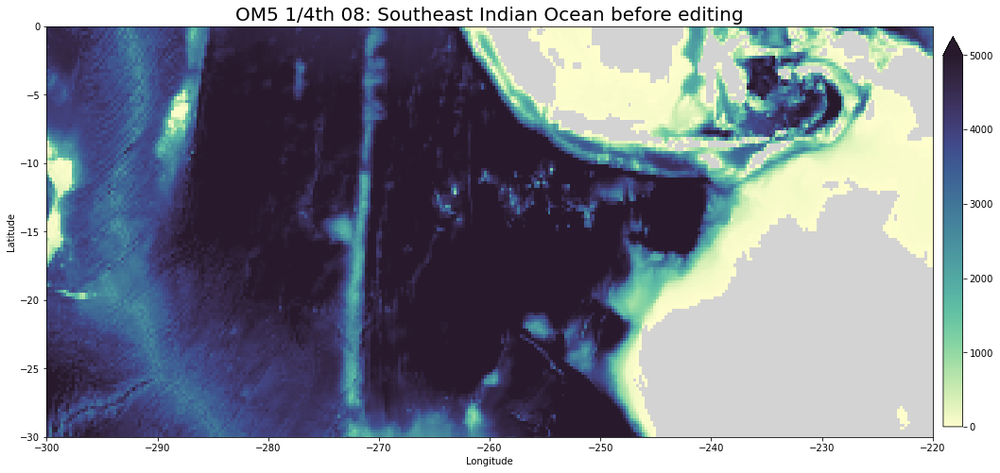

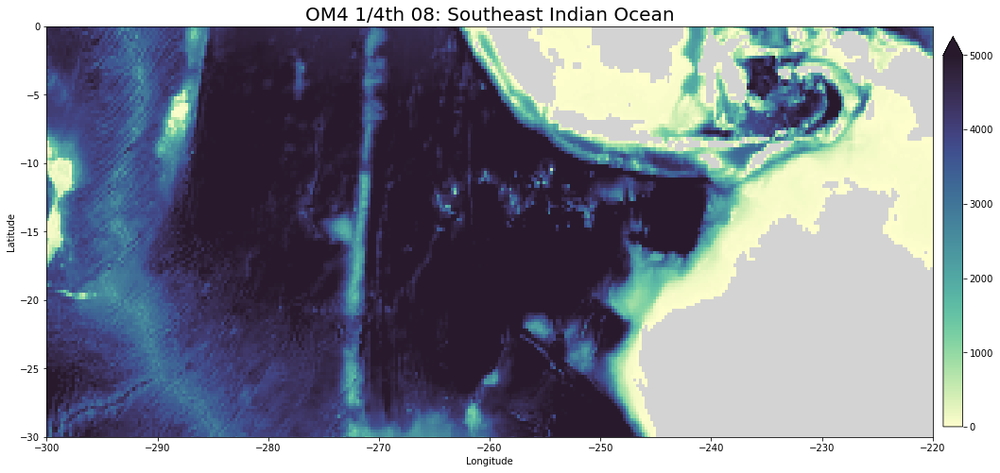

In [7]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (Region_Boundaries[2],Region_Boundaries[3]),
          (Region_Boundaries[0],Region_Boundaries[1]),
          0, 5000, Region_Name, om4=True, new=False)

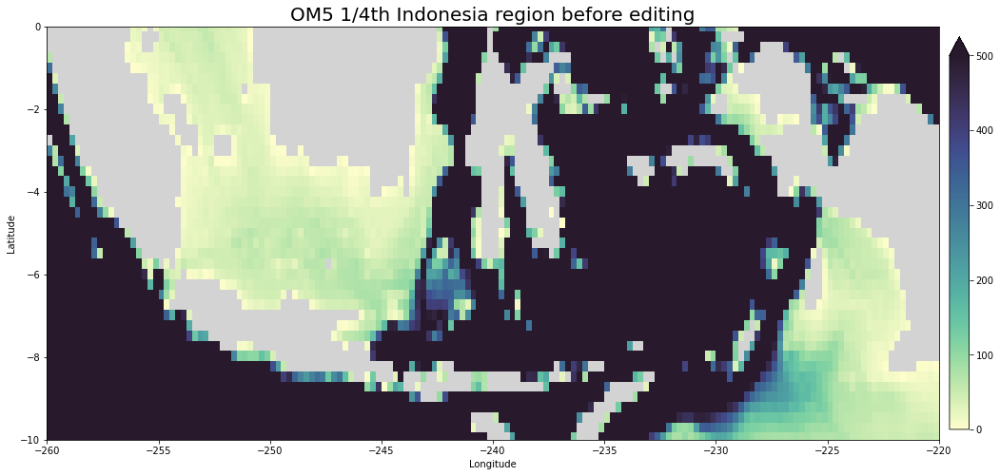

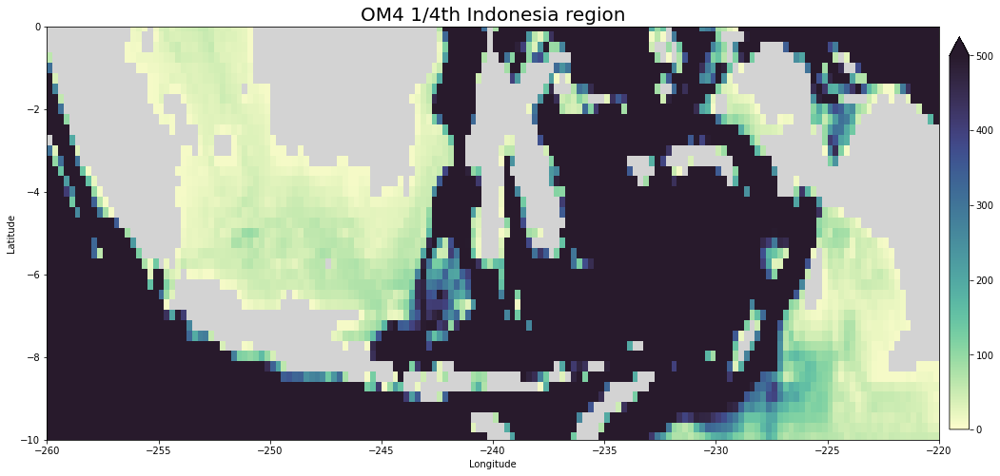

In [8]:
# Broad view of Zoom in on region before editing 

broadview(OM4,OM5,(-260,-220), (-10,0), 0, 500, "Indonesia region", om4=True, new=False)

Gebco (js:je,is:ie) = 14399:16799,0:2399
OM4 model (js:je,is:ie) = 376:422,0:40
OM5 model (js:je,is:ie) = 457:503,0:40
Using xlim = (-300.0, -290.0) ylim = (-30.0, -20.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 16799:19199,0:2399
OM4 model (js:je,is:ie) = 420:464,0:40
OM5 model (js:je,is:ie) = 501:545,0:40
Using xlim = (-300.0, -290.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,0:2399
OM4 model (js:je,is:ie) = 462:504,0:40
OM5 model (js:je,is:ie) = 543:585,0:40
Using xlim = (-300.0, -290.0) ylim = (-10.0, 0.0)


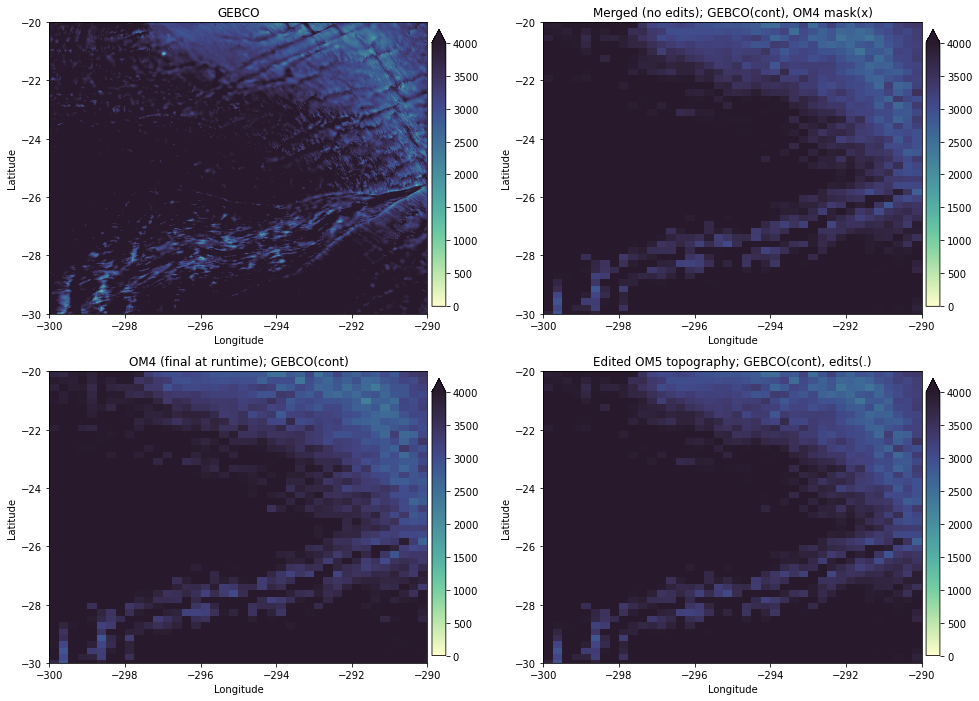

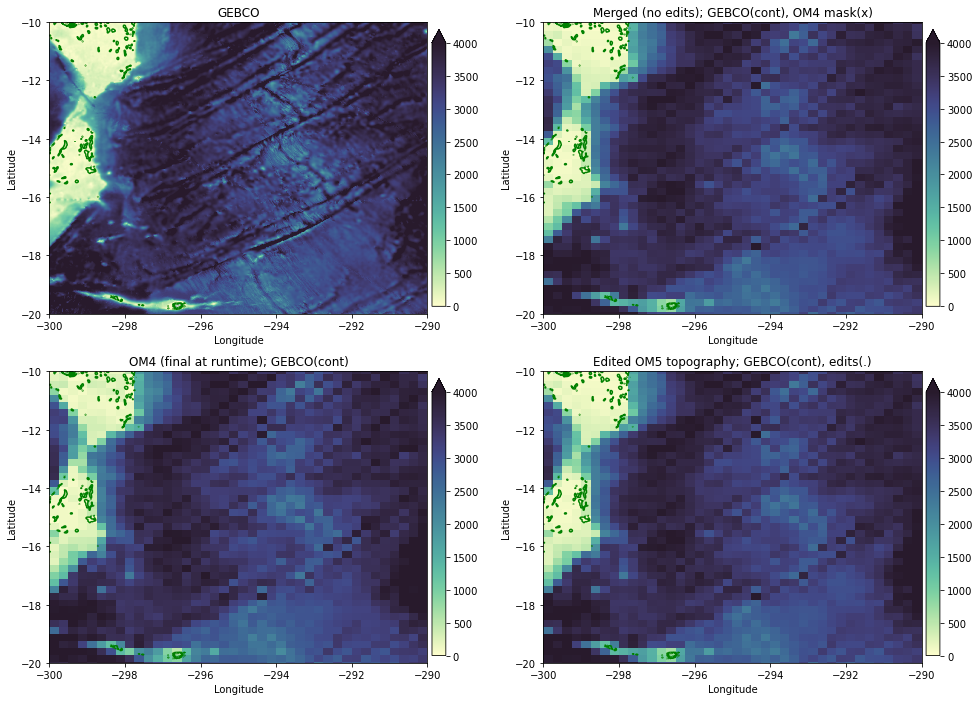

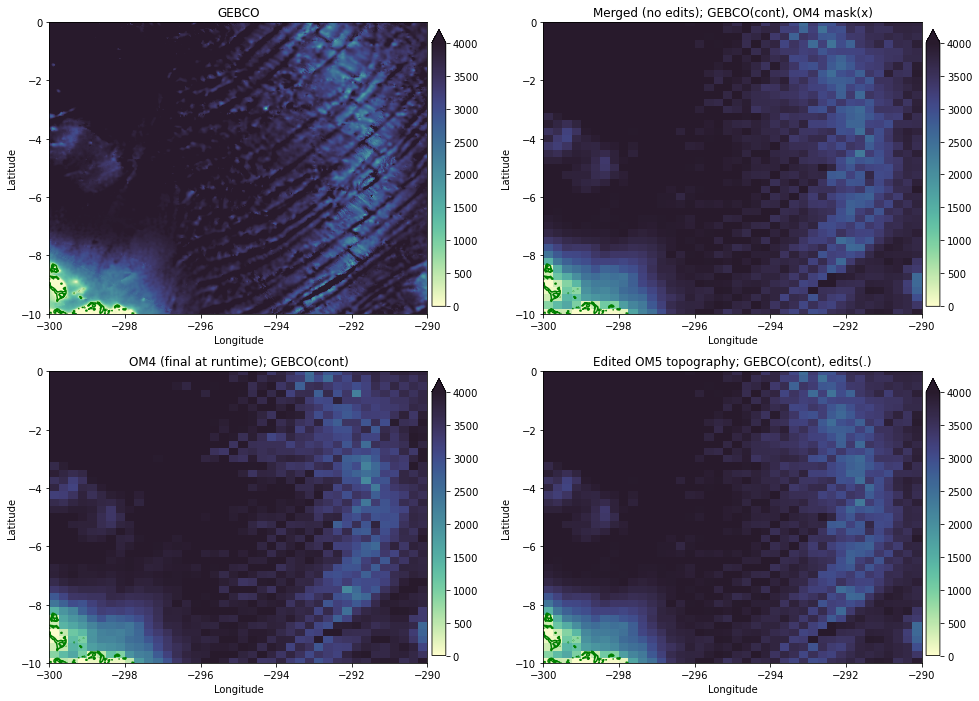

In [9]:
region = Region(-295, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-295, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-295, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 18299:18899,0:539
OM4 model (js:je,is:ie) = 446:459,0:9
OM5 model (js:je,is:ie) = 527:540,0:9
Using xlim = (-300.25, -297.75) ylim = (-13.75, -11.25)


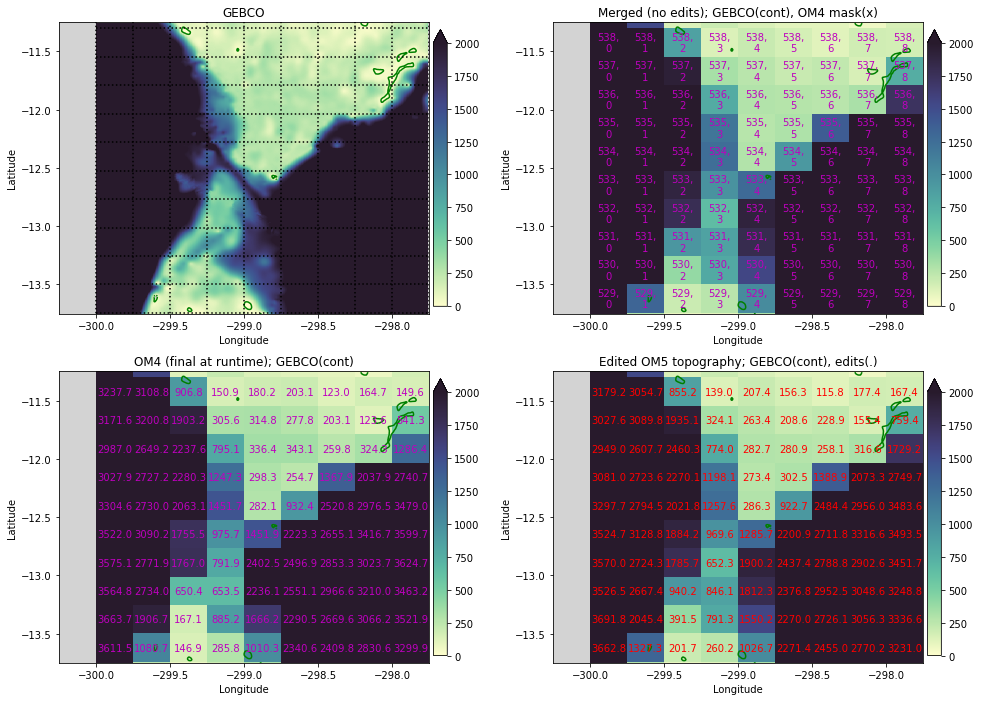

In [10]:
#Zoom in on potential choke points - will leave this be for now is it is very narrow.
region = Region(-299, -12.5, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 2000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 14399:16799,2399:4800
OM4 model (js:je,is:ie) = 376:422,38:80
OM5 model (js:je,is:ie) = 457:503,38:80
Using xlim = (-290.0, -280.0) ylim = (-30.0, -20.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 16799:19199,2399:4800
OM4 model (js:je,is:ie) = 420:464,38:80
OM5 model (js:je,is:ie) = 501:545,38:80
Using xlim = (-290.0, -280.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,2399:4800
OM4 model (js:je,is:ie) = 462:504,38:80
OM5 model (js:je,is:ie) = 543:585,38:80
Using xlim = (-290.0, -280.0) ylim = (-10.0, 0.0)


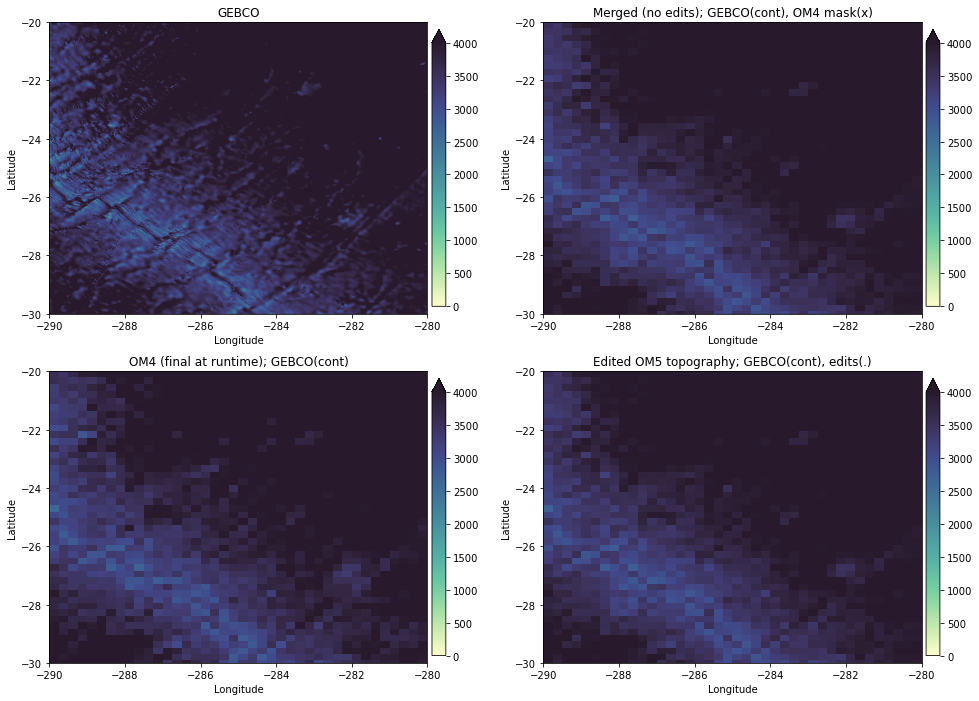

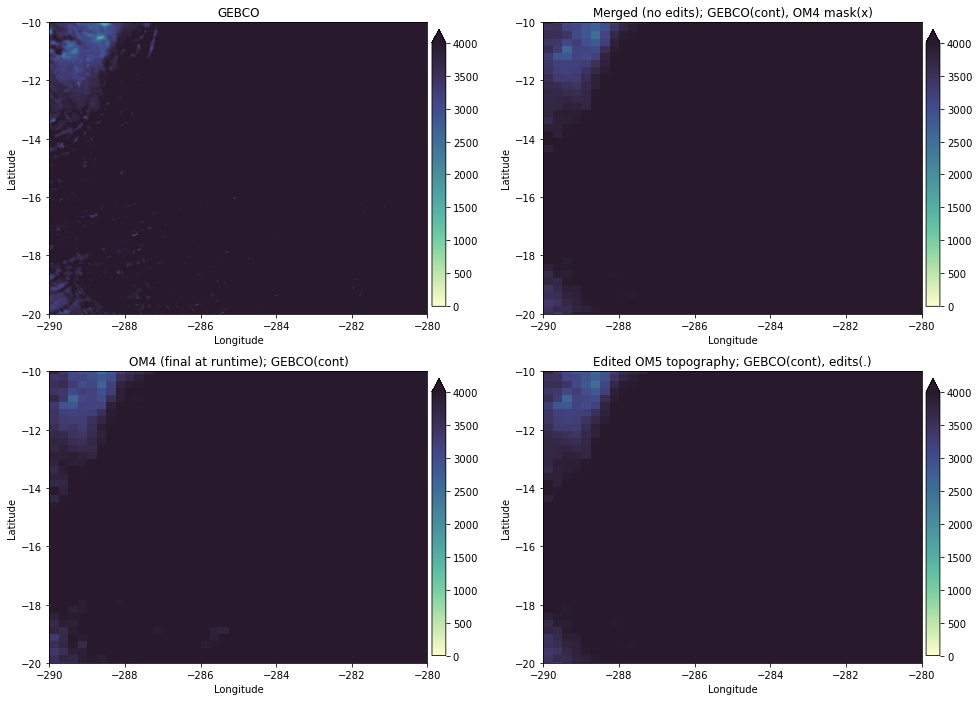

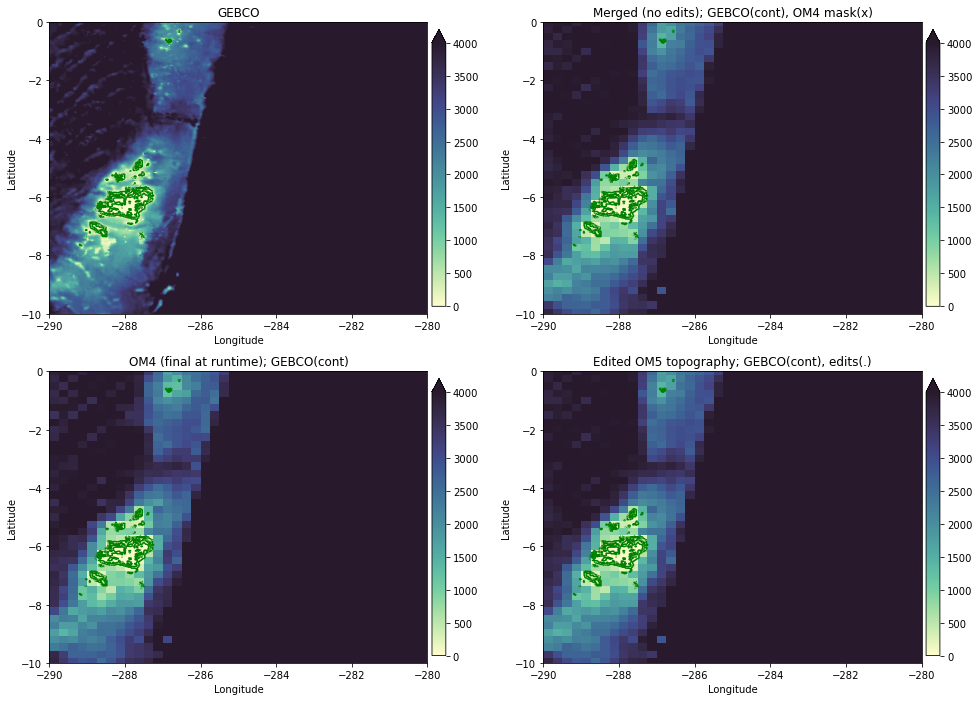

In [11]:
region = Region(-285, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-285, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-285, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 14399:16799,4800:7200
OM4 model (js:je,is:ie) = 376:422,78:120
OM5 model (js:je,is:ie) = 457:503,78:120
Using xlim = (-280.0, -270.0) ylim = (-30.0, -20.0)
Gebco (js:je,is:ie) = 16799:19199,4800:7200
OM4 model (js:je,is:ie) = 420:464,78:120
OM5 model (js:je,is:ie) = 501:545,78:120
Using xlim = (-280.0, -270.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,4800:7200
OM4 model (js:je,is:ie) = 462:504,78:120
OM5 model (js:je,is:ie) = 543:585,78:120
Using xlim = (-280.0, -270.0) ylim = (-10.0, 0.0)


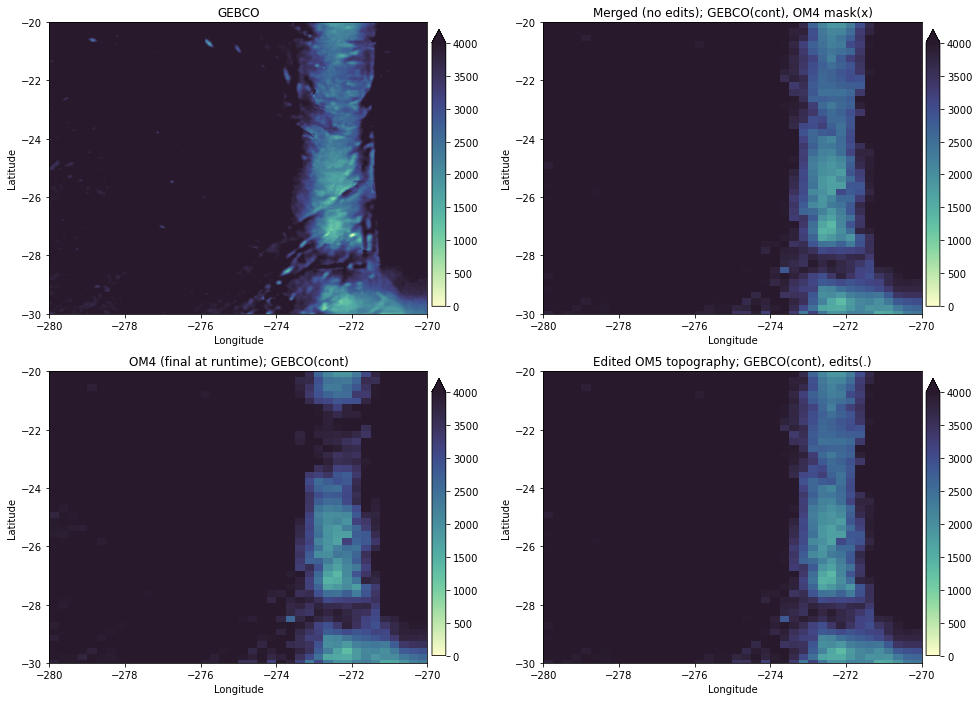

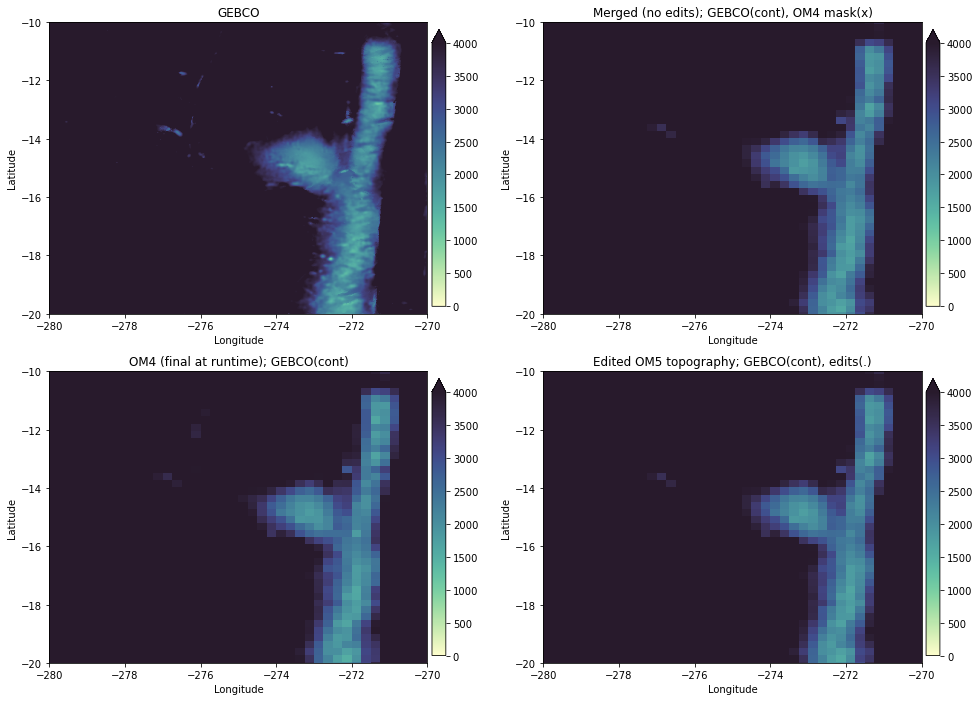

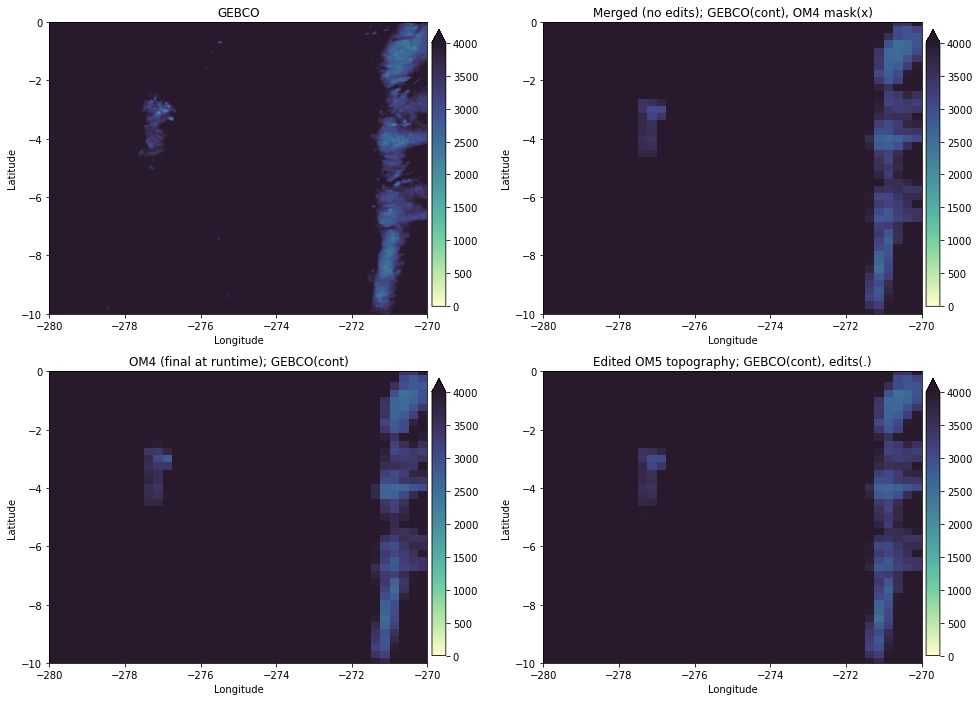

In [12]:
region = Region(-275, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-275, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-275, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 14399:16799,7200:9600
OM4 model (js:je,is:ie) = 376:422,118:160
OM5 model (js:je,is:ie) = 457:503,118:160
Using xlim = (-270.0, -260.0) ylim = (-30.0, -20.0)
Gebco (js:je,is:ie) = 16799:19199,7200:9600
OM4 model (js:je,is:ie) = 420:464,118:160
OM5 model (js:je,is:ie) = 501:545,118:160
Using xlim = (-270.0, -260.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,7200:9600
OM4 model (js:je,is:ie) = 462:504,118:160
OM5 model (js:je,is:ie) = 543:585,118:160
Using xlim = (-270.0, -260.0) ylim = (-10.0, 0.0)


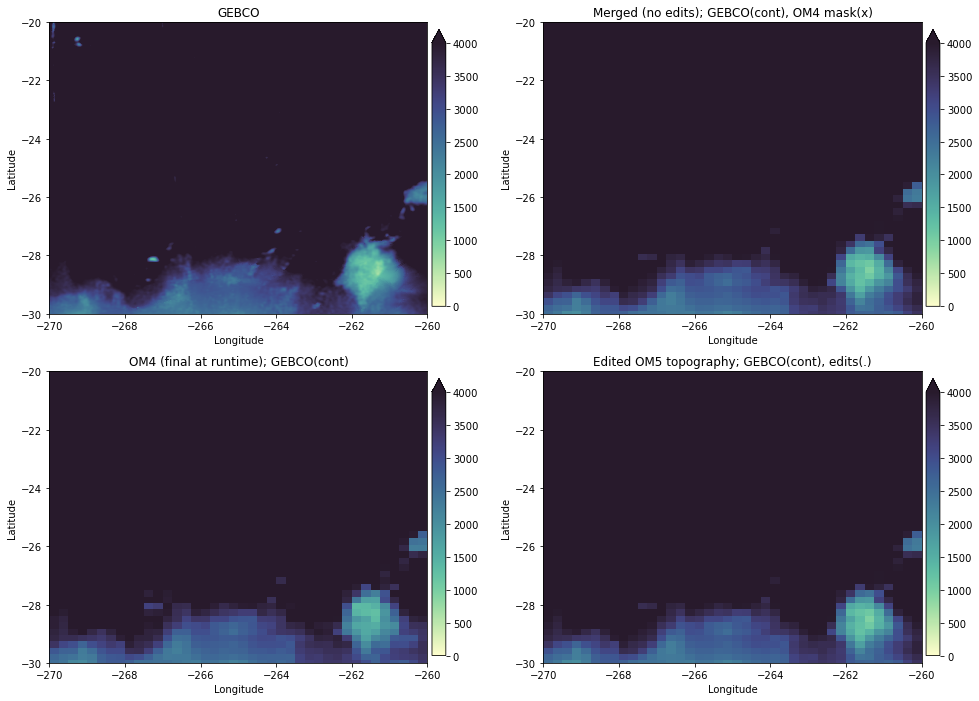

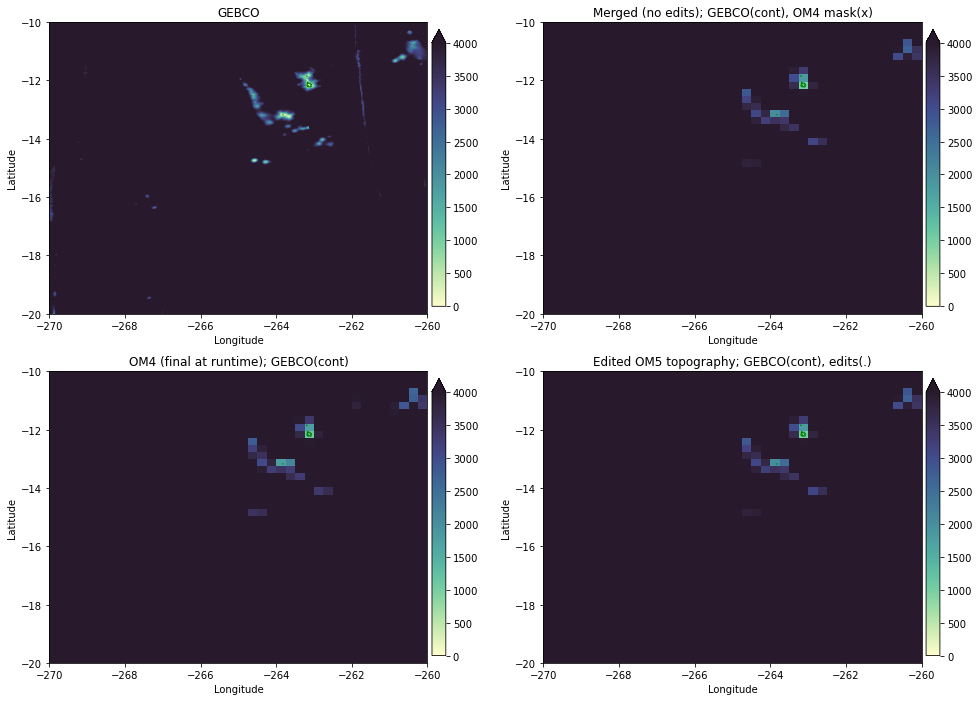

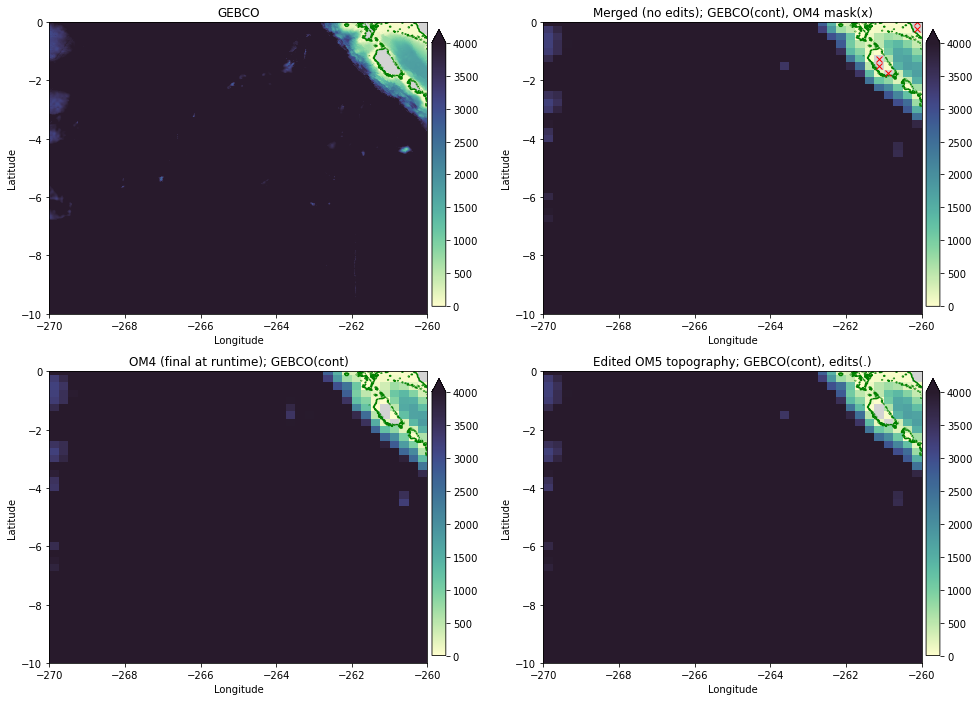

In [13]:
region = Region(-265, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-265, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-265, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 21119:21599,9120:9600
OM4 model (js:je,is:ie) = 494:504,150:160
OM5 model (js:je,is:ie) = 575:585,150:160
Using xlim = (-262.0, -260.0) ylim = (-2.0, 0.0)


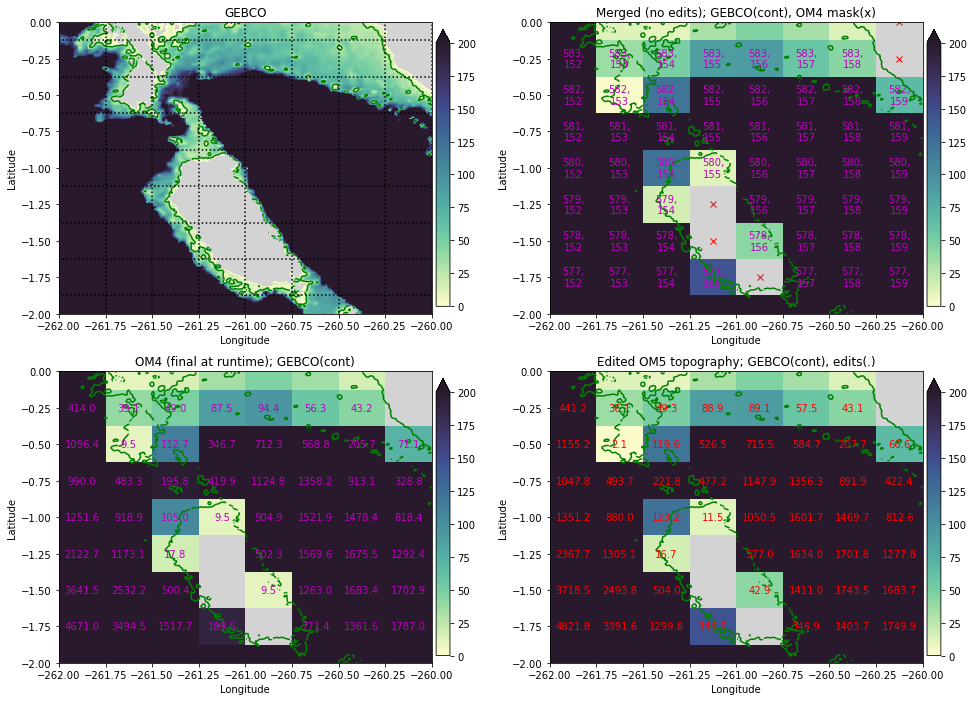

In [14]:
#Zoom in region - Baruju and Totoinong
# Perhaps could insert Baruju, but will leave it out.  Channel looks okay, but probably should be narrower.

region = Region(-261, -1, width_lon=2, width_lat=2)
map_region(region, 0, 200, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 14399:16799,9600:12000
OM4 model (js:je,is:ie) = 376:422,158:200
OM5 model (js:je,is:ie) = 457:503,158:200
Using xlim = (-260.0, -250.0) ylim = (-30.0, -20.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 16799:19199,9600:12000
OM4 model (js:je,is:ie) = 420:464,158:200
OM5 model (js:je,is:ie) = 501:545,158:200
Using xlim = (-260.0, -250.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,9600:12000
OM4 model (js:je,is:ie) = 462:504,158:200
OM5 model (js:je,is:ie) = 543:585,158:200
Using xlim = (-260.0, -250.0) ylim = (-10.0, 0.0)


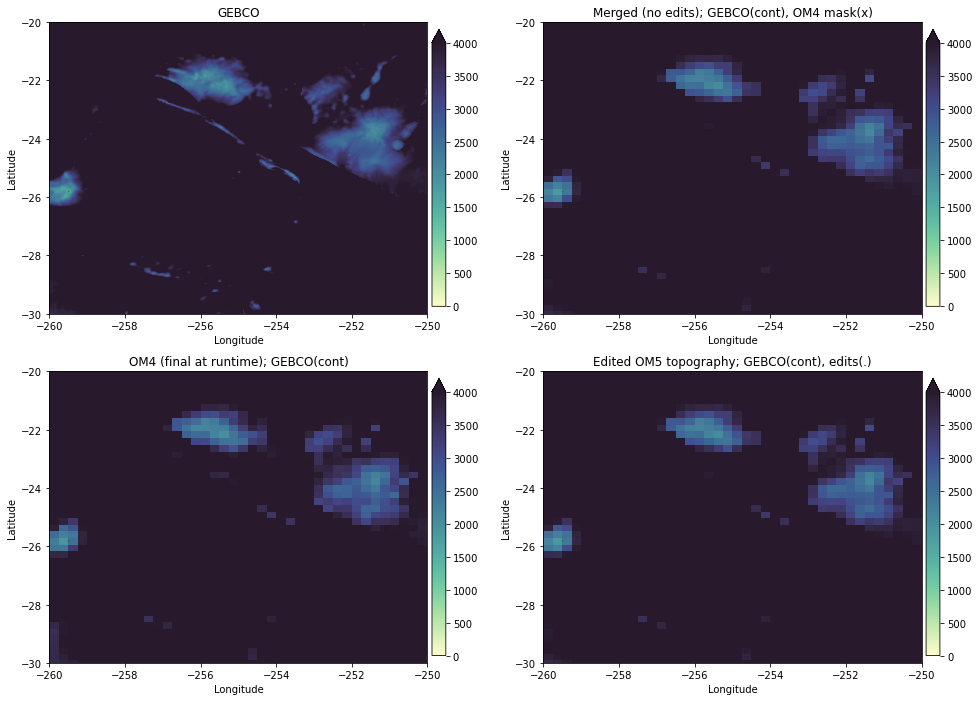

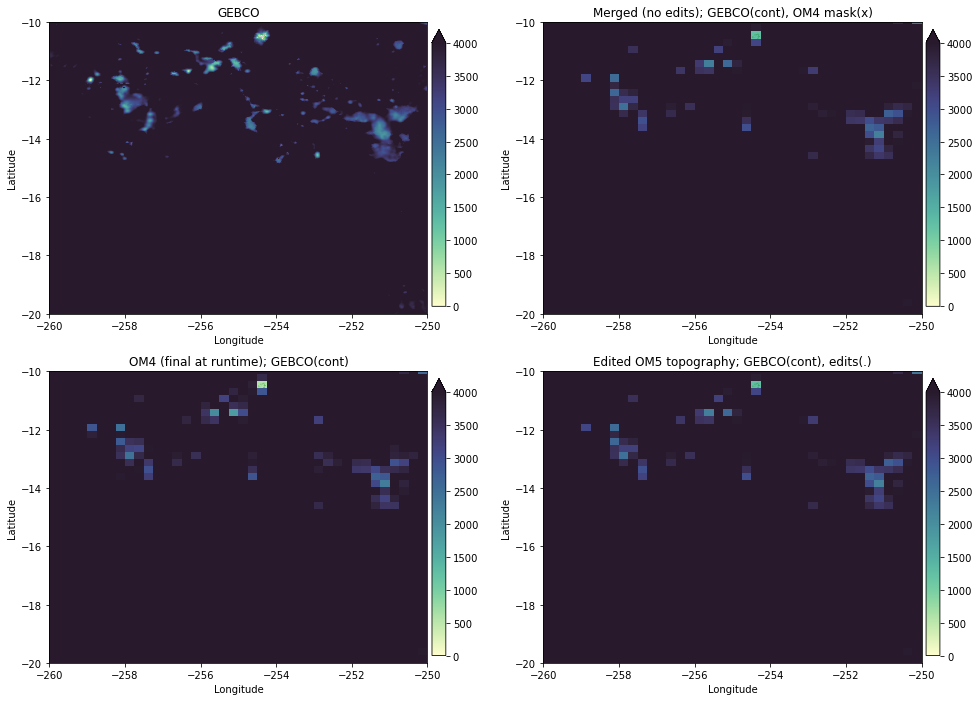

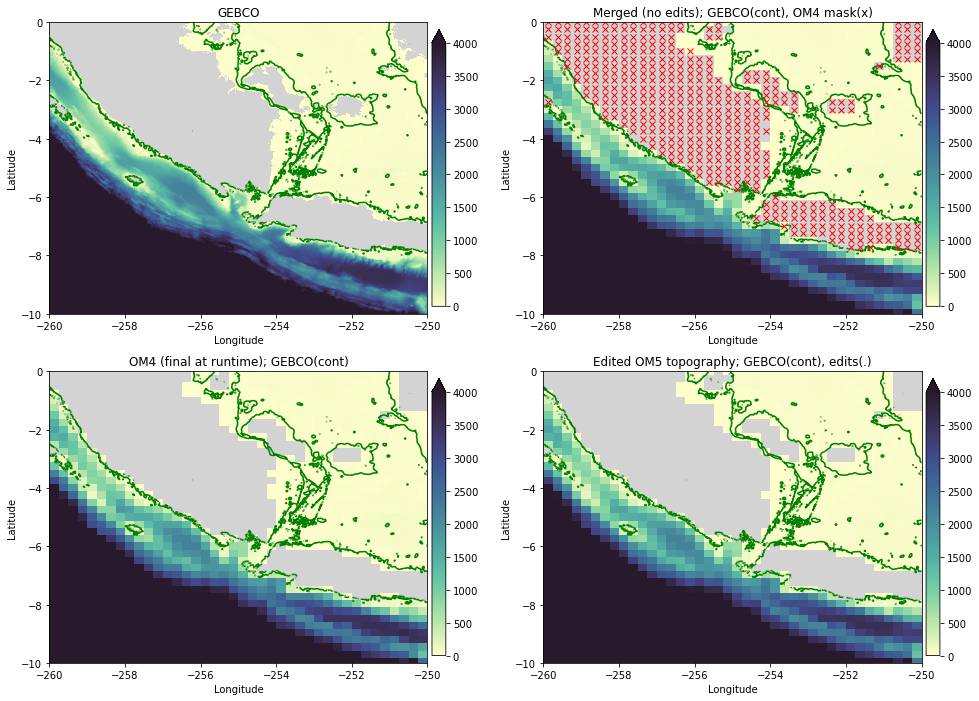

In [15]:
region = Region(-255, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-255, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-255, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 20099:20699,9780:10380
OM4 model (js:je,is:ie) = 477:489,161:173
OM5 model (js:je,is:ie) = 558:570,161:173
Using xlim = (-259.25, -256.75) ylim = (-6.25, -3.75)


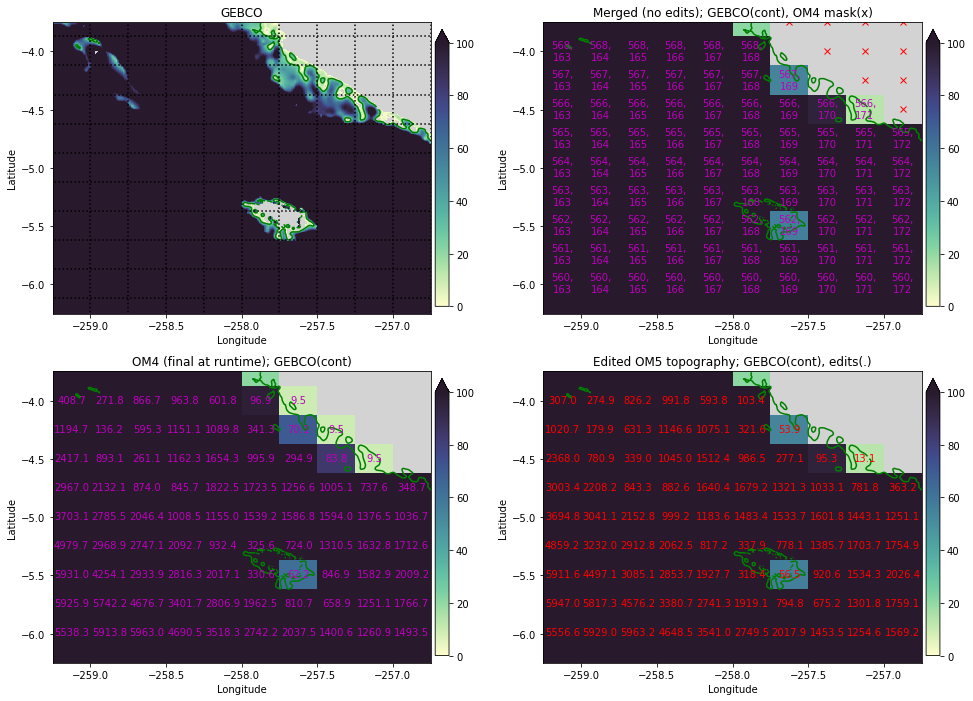

In [16]:
region = Region(-258, -5, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 100, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);
# Could insert island, will leave it out.


Gebco (js:je,is:ie) = 20579:21179,10740:11340
OM4 model (js:je,is:ie) = 485:497,177:189
OM5 model (js:je,is:ie) = 566:578,177:189
Using xlim = (-255.25, -252.75) ylim = (-4.25, -1.75)


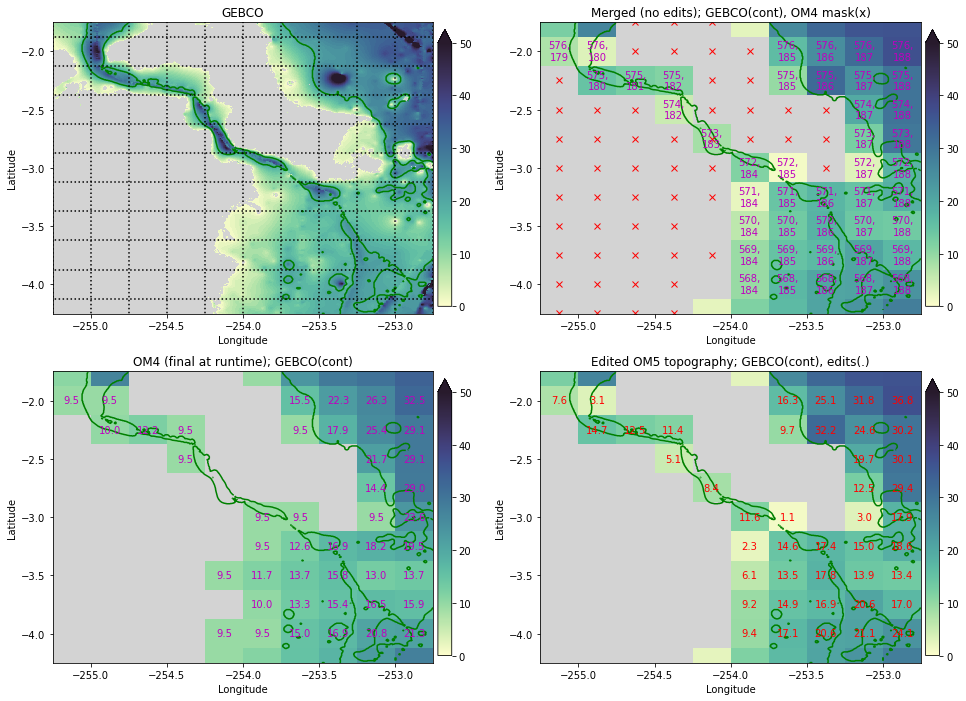

In [17]:
#Could add this channel, but it is probably okay.

# OM5.depth[576,180]=20
# OM5.depth[575,180]=20
# OM5.depth[575,181]=20
# OM5.depth[575,182]=20
# OM5.depth[574,182]=20
# OM5.depth[573,182]=20
# OM5.depth[573,182]=20
# OM5.depth[573,182]=20
# OM5.depth[573,183]=20
# OM5.depth[572,183]=20

region = Region(-254, -3, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 50, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 19859:20459,10620:11220
OM4 model (js:je,is:ie) = 473:485,175:187
OM5 model (js:je,is:ie) = 554:566,175:187
Using xlim = (-255.75, -253.25) ylim = (-7.25, -4.75)


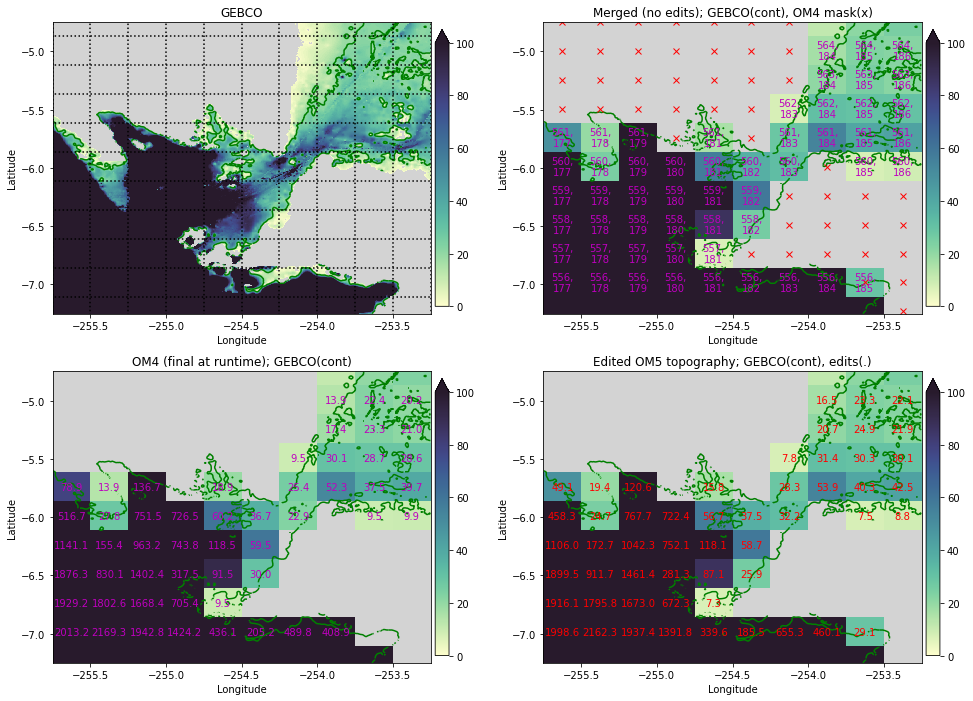

In [18]:
#Looks reasonable, no edits

region = Region(-254.5, -6, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 100, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 20579:21179,10980:11580
OM4 model (js:je,is:ie) = 485:497,181:193
OM5 model (js:je,is:ie) = 566:578,181:193
Using xlim = (-254.25, -251.75) ylim = (-4.25, -1.75)


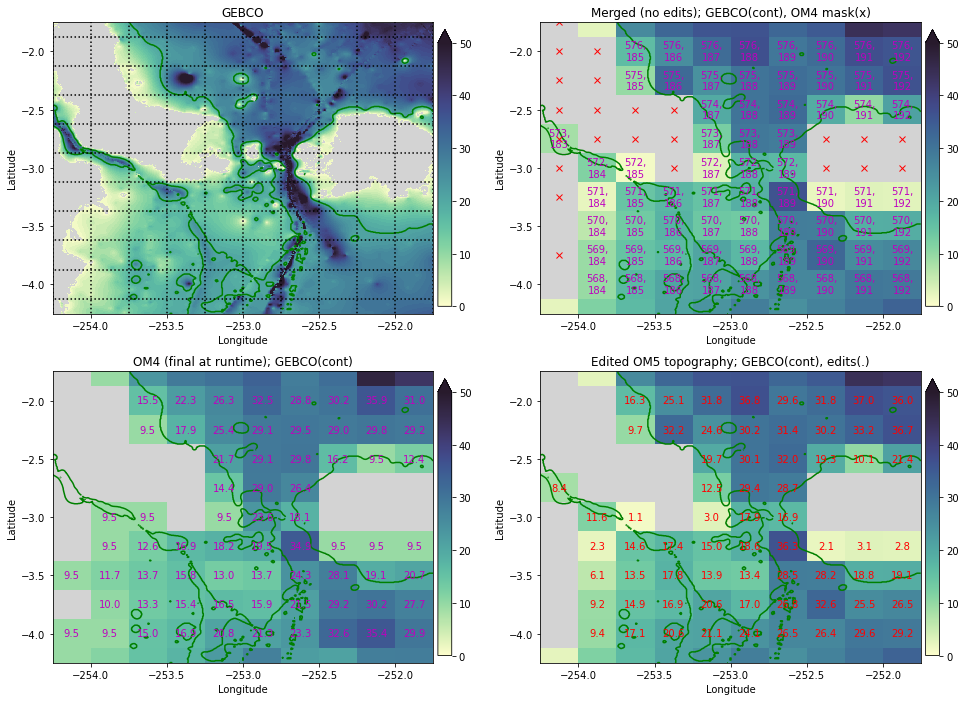

In [19]:
#Reasonable
region = Region(-253, -3, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 50, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 14399:16799,12000:14400
OM4 model (js:je,is:ie) = 376:422,198:240
OM5 model (js:je,is:ie) = 457:503,198:240
Using xlim = (-250.0, -240.0) ylim = (-30.0, -20.0)
Gebco (js:je,is:ie) = 16799:19199,12000:14400
OM4 model (js:je,is:ie) = 420:464,198:240
OM5 model (js:je,is:ie) = 501:545,198:240
Using xlim = (-250.0, -240.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,12000:14400
OM4 model (js:je,is:ie) = 462:504,198:240
OM5 model (js:je,is:ie) = 543:585,198:240
Using xlim = (-250.0, -240.0) ylim = (-10.0, 0.0)


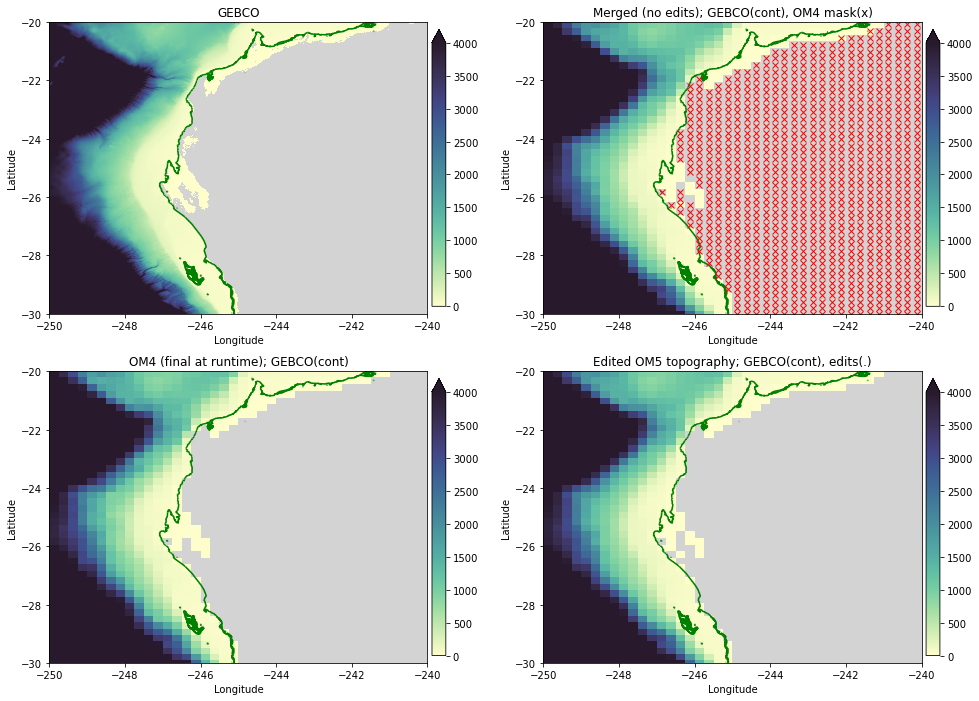

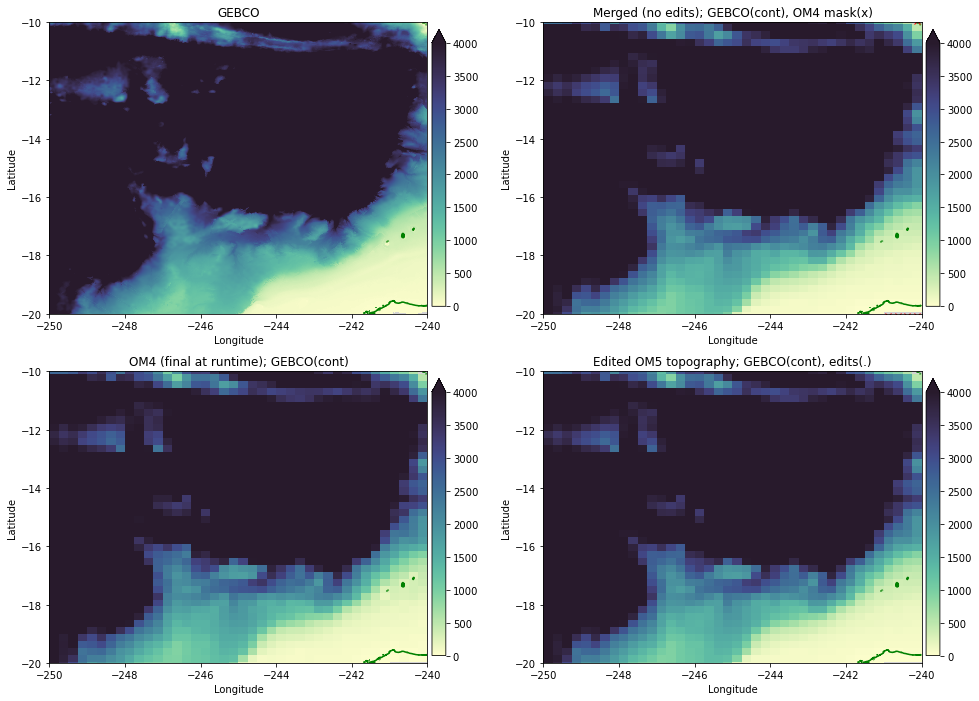

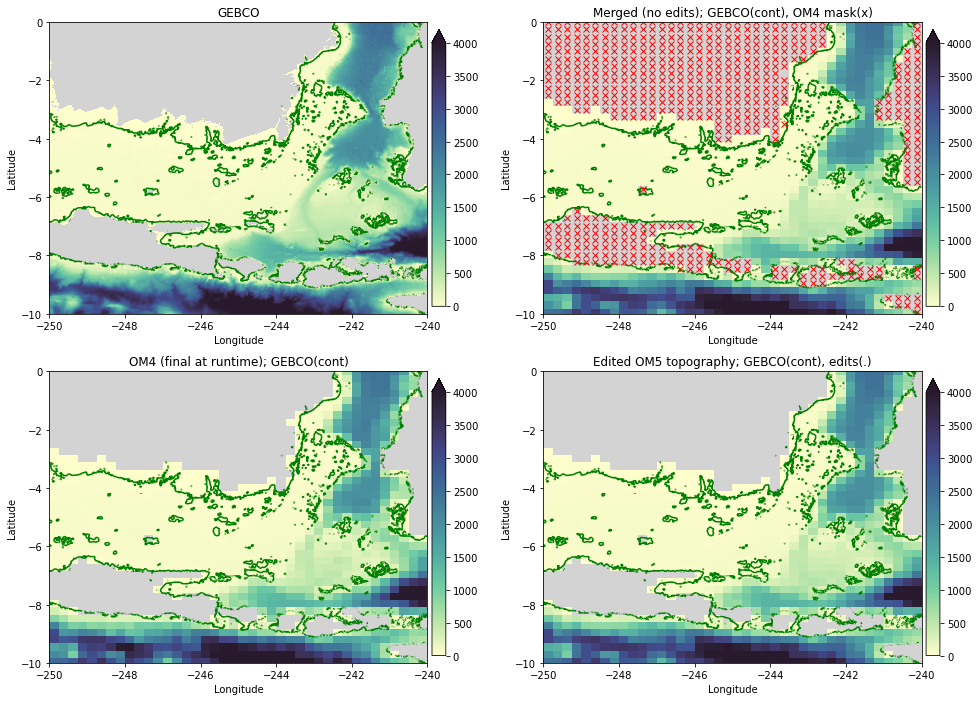

In [20]:
region = Region(-245, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-245, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-245, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 19379:19979,12900:13500
OM4 model (js:je,is:ie) = 465:477,213:225
OM5 model (js:je,is:ie) = 546:558,213:225
Using xlim = (-246.25, -243.75) ylim = (-9.25, -6.75)


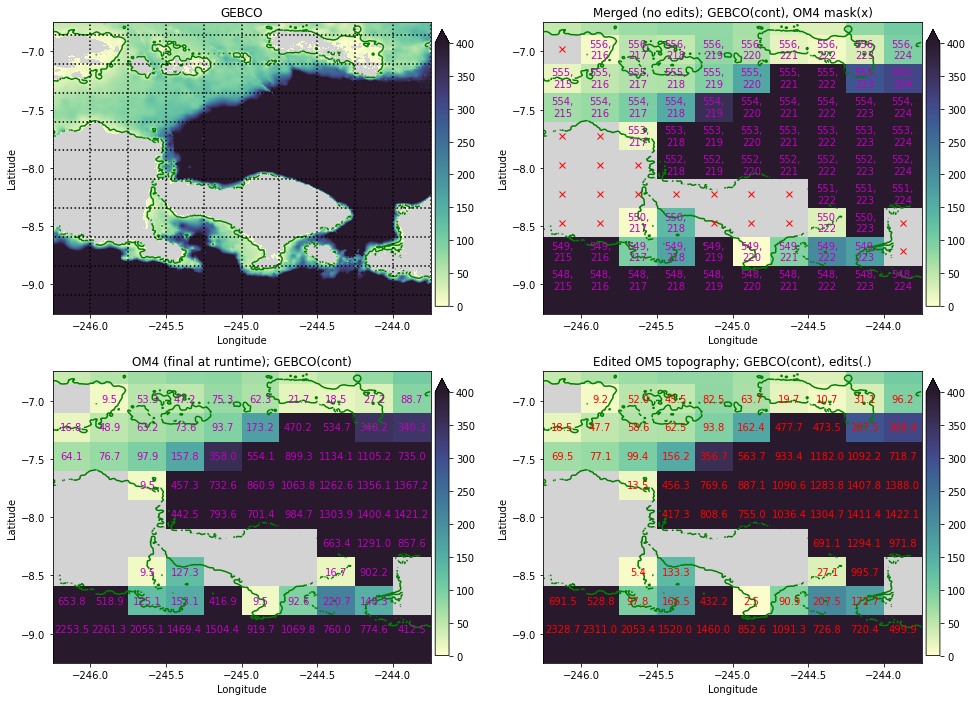

In [21]:
#Reasonable
region = Region(-245, -8, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 19379:19979,13860:14460
OM4 model (js:je,is:ie) = 465:477,229:241
OM5 model (js:je,is:ie) = 546:558,229:241
Using xlim = (-242.25, -239.75) ylim = (-9.25, -6.75)


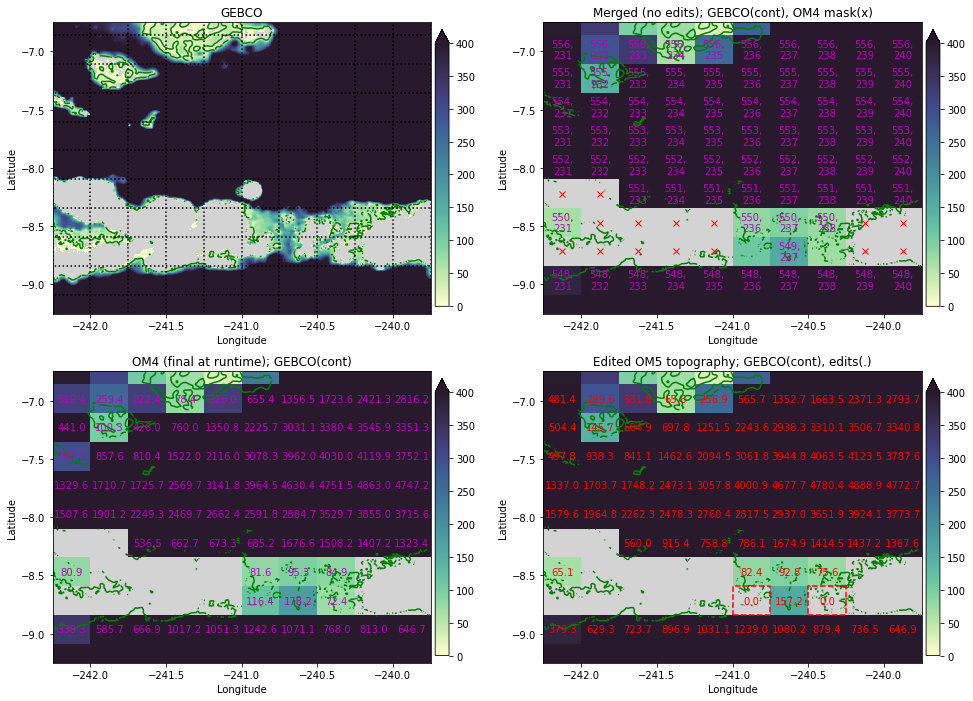

In [22]:
#Somewhat too open of a channel
OM5.depth[549,236] = 0
OM5.depth[549,238] = 0
region = Region(-241, -8, width_lon=2.5, width_lat=2.5)

map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);

Gebco (js:je,is:ie) = 15059:15659,12660:13260
OM4 model (js:je,is:ie) = 389:402,209:221
OM5 model (js:je,is:ie) = 470:483,209:221
Using xlim = (-247.25, -244.75) ylim = (-27.25, -24.75)


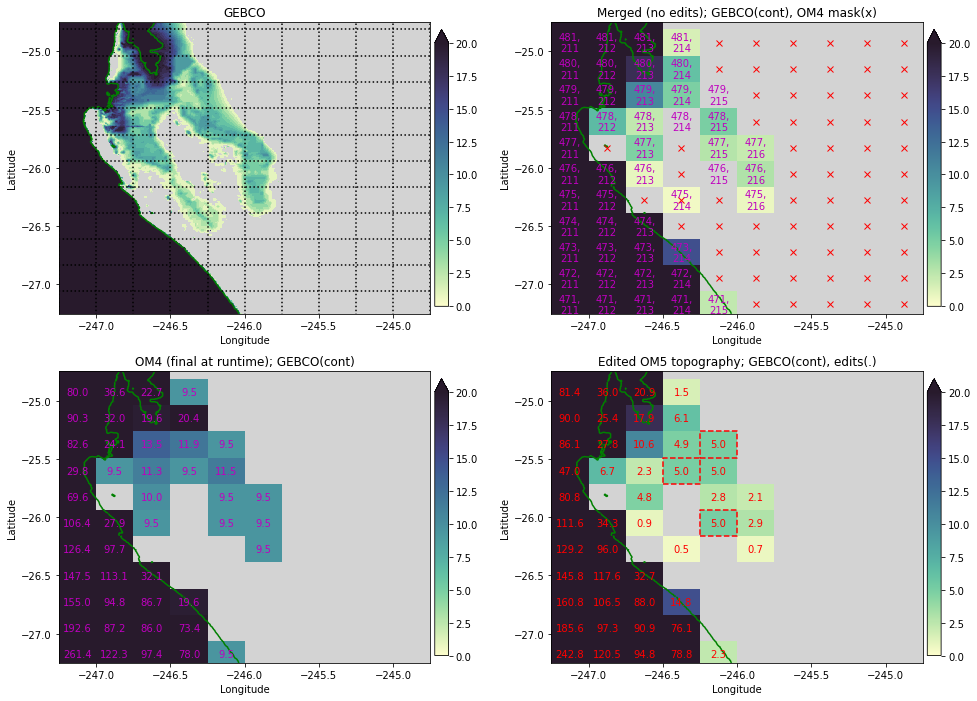

In [23]:
#Opening up Shark Bay
OM5.depth[479,215] = 5
OM5.depth[478,214] = 5
OM5.depth[476,215] = 5
region = Region(-246, -26, width_lon=2.5, width_lat=2.5)
map_region(region, 0, 20, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 14399:16799,14400:16800
OM4 model (js:je,is:ie) = 376:422,238:280
OM5 model (js:je,is:ie) = 457:503,238:280
Using xlim = (-240.0, -230.0) ylim = (-30.0, -20.0)


/net2/bgr/anaconda3/envs/oceans/lib/python3.8/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/net2/bgr/anaconda3/envs/oceans/lib/python3.8/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 16799:19199,14400:16800
OM4 model (js:je,is:ie) = 420:464,238:280
OM5 model (js:je,is:ie) = 501:545,238:280
Using xlim = (-240.0, -230.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,14400:16800
OM4 model (js:je,is:ie) = 462:504,238:280
OM5 model (js:je,is:ie) = 543:585,238:280
Using xlim = (-240.0, -230.0) ylim = (-10.0, 0.0)


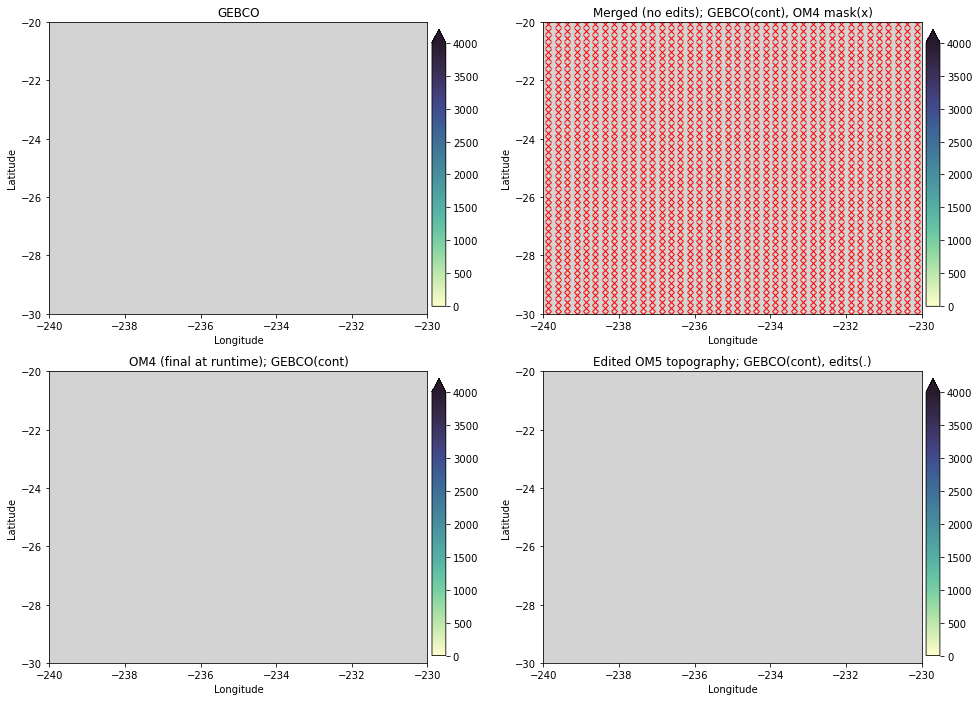

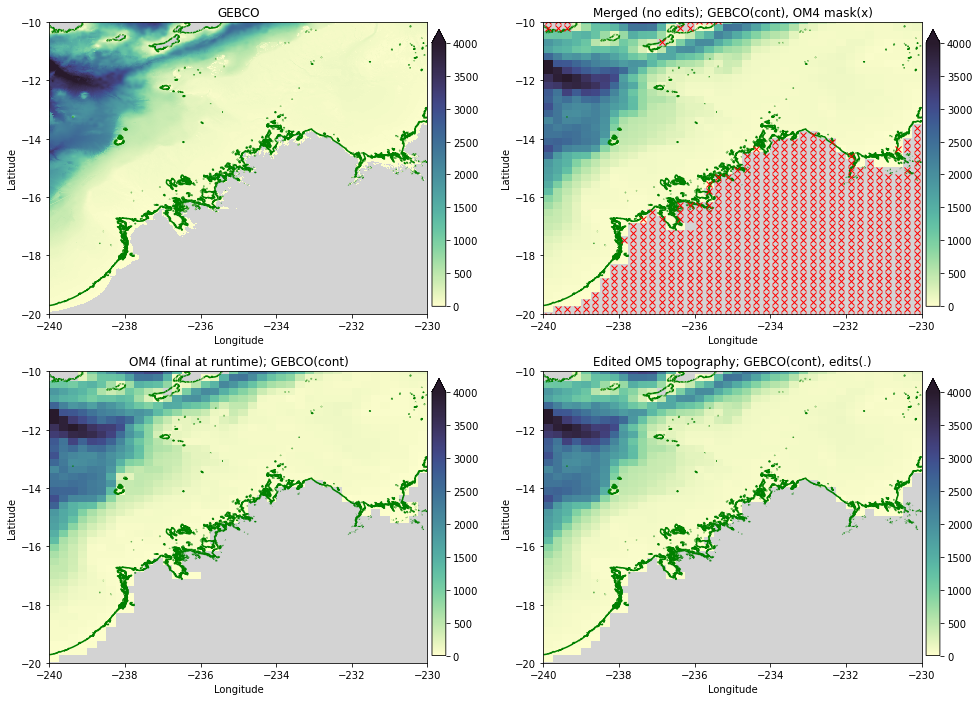

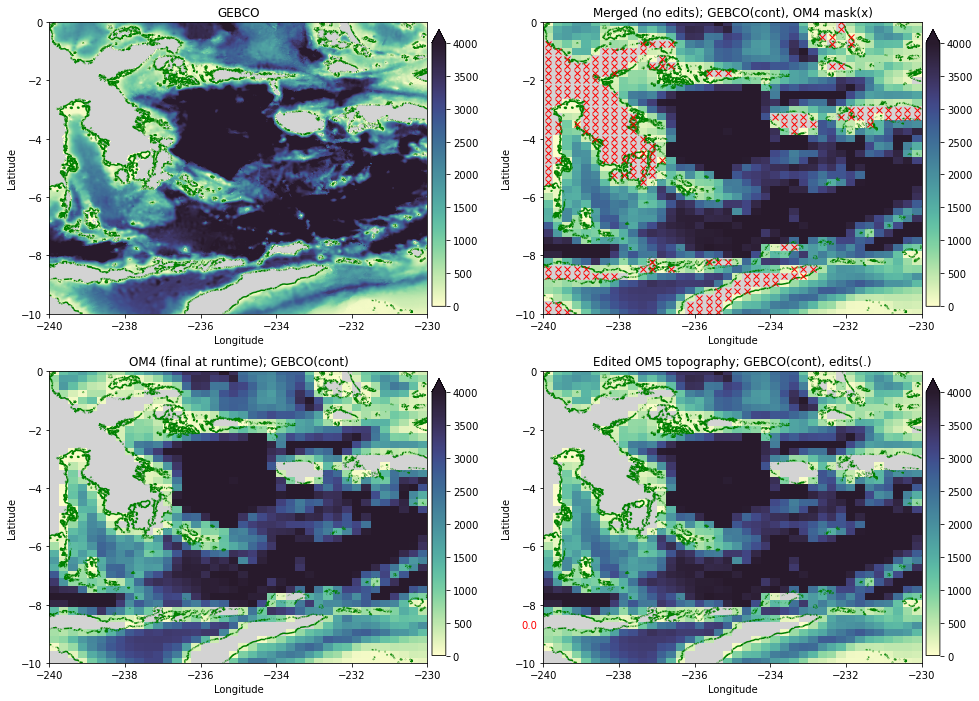

In [24]:
region = Region(-235, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-235, -15, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-235, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 19439:19919,14760:15240
OM4 model (js:je,is:ie) = 466:476,244:254
OM5 model (js:je,is:ie) = 547:557,244:254
Using xlim = (-238.5, -236.5) ylim = (-9.0, -7.0)


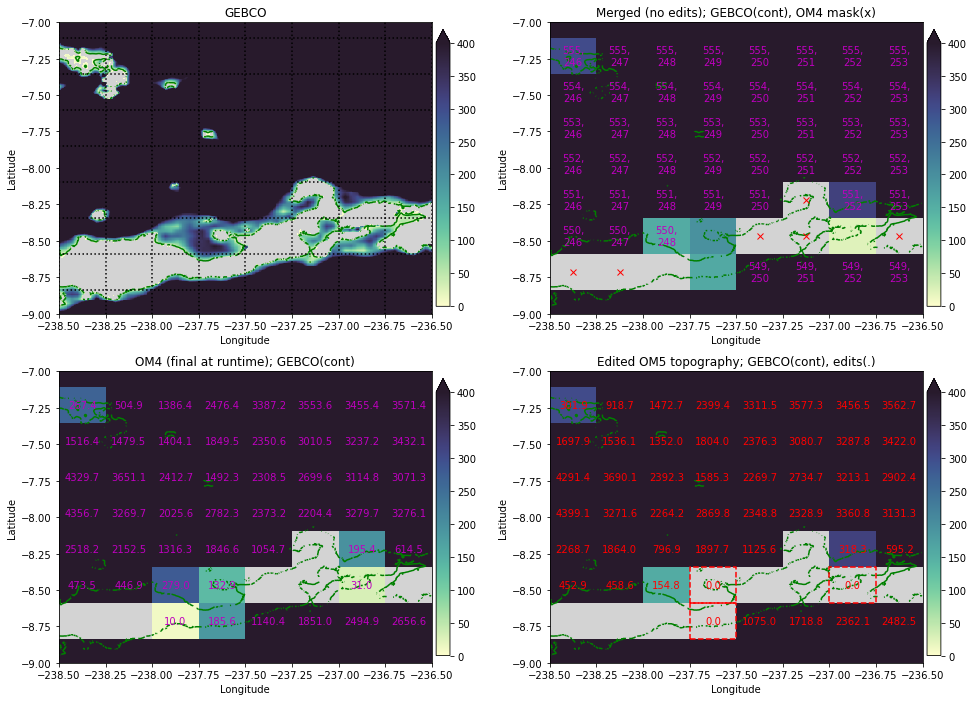

In [25]:
#Close False channel in East Nusa Tenggara

OM5.depth[550,249]=0.0
OM5.depth[549,249]=0.0
OM5.depth[550,252]=0.0

region = Region(-237.5, -8, width_lon=2, width_lat=2)
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 19439:19919,15240:15720
OM4 model (js:je,is:ie) = 466:476,252:262
OM5 model (js:je,is:ie) = 547:557,252:262
Using xlim = (-236.5, -234.5) ylim = (-9.0, -7.0)


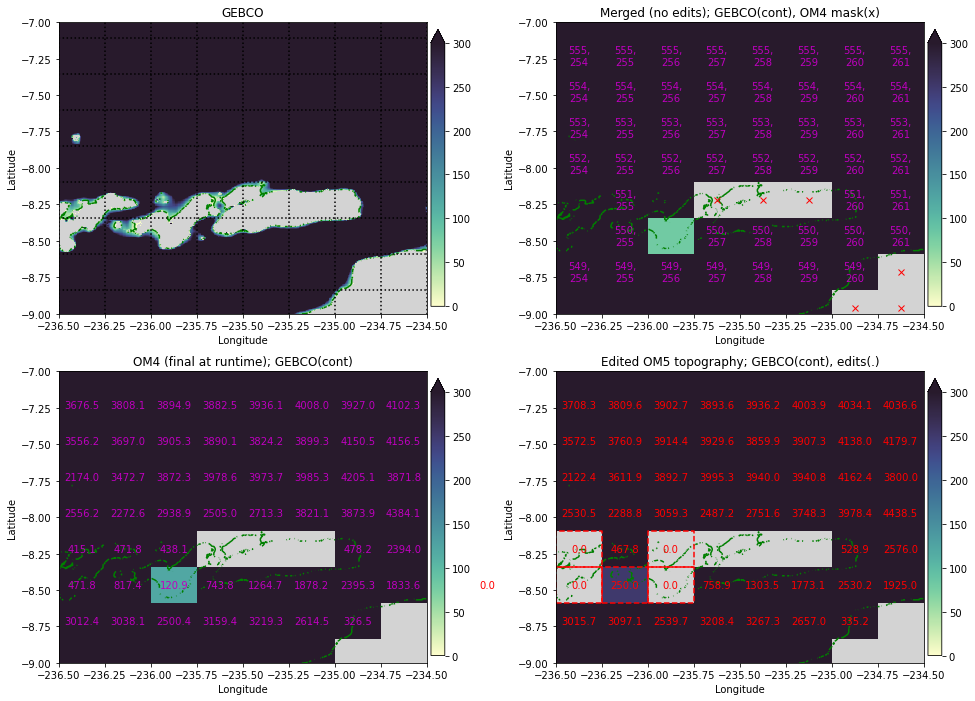

In [26]:
#Closing more False channels

OM5.depth[550,254]=0.0
OM5.depth[551,254]=0.0
OM5.depth[550,255]=250.0
OM5.depth[550,256]=0.0
OM5.depth[551,256]=0.0

region = Region(-235.5, -8, width_lon=2, width_lat=2)
map_region(region, 0, 300, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=True);


Gebco (js:je,is:ie) = 14399:16799,16800:19200
OM4 model (js:je,is:ie) = 376:422,278:320
OM5 model (js:je,is:ie) = 457:503,278:320
Using xlim = (-230.0, -220.0) ylim = (-30.0, -20.0)


./tools/topo_tools.py:202: UserWarning: No contour levels were found within the data range.
  thisax.contour(GEBCO.lonh[Gis:Gie], GEBCO.lath[Gjs:Gje], zmask( GEBCO.depth[Gjs:Gje,Gis:Gie] ),


Gebco (js:je,is:ie) = 16799:19199,16800:19200
OM4 model (js:je,is:ie) = 420:464,278:320
OM5 model (js:je,is:ie) = 501:545,278:320
Using xlim = (-230.0, -220.0) ylim = (-20.0, -10.0)
Gebco (js:je,is:ie) = 19199:21599,16800:19200
OM4 model (js:je,is:ie) = 462:504,278:320
OM5 model (js:je,is:ie) = 543:585,278:320
Using xlim = (-230.0, -220.0) ylim = (-10.0, 0.0)


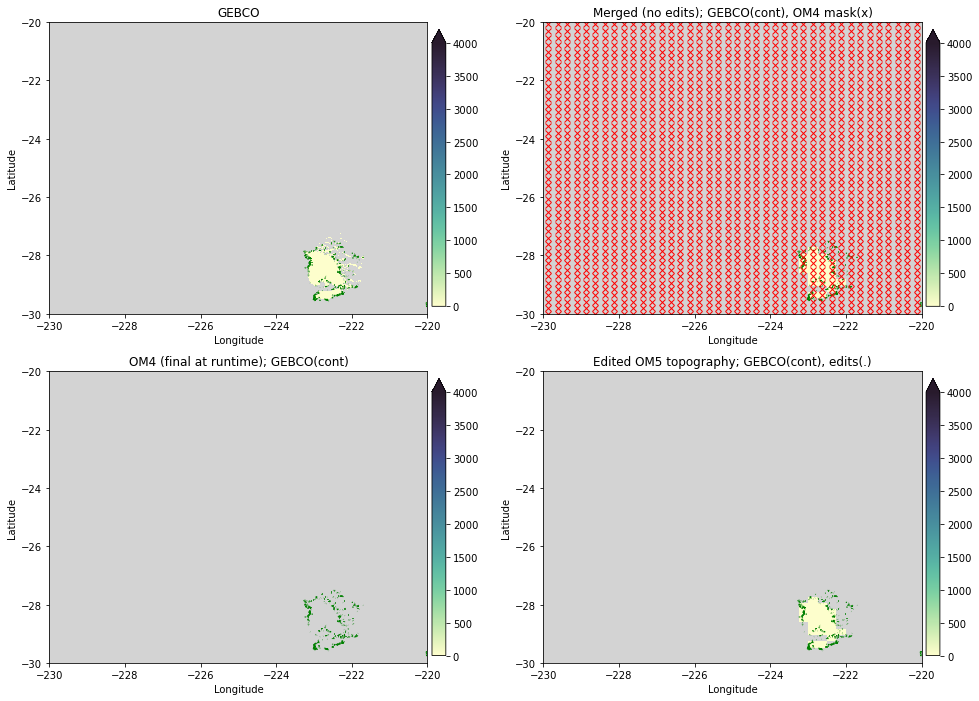

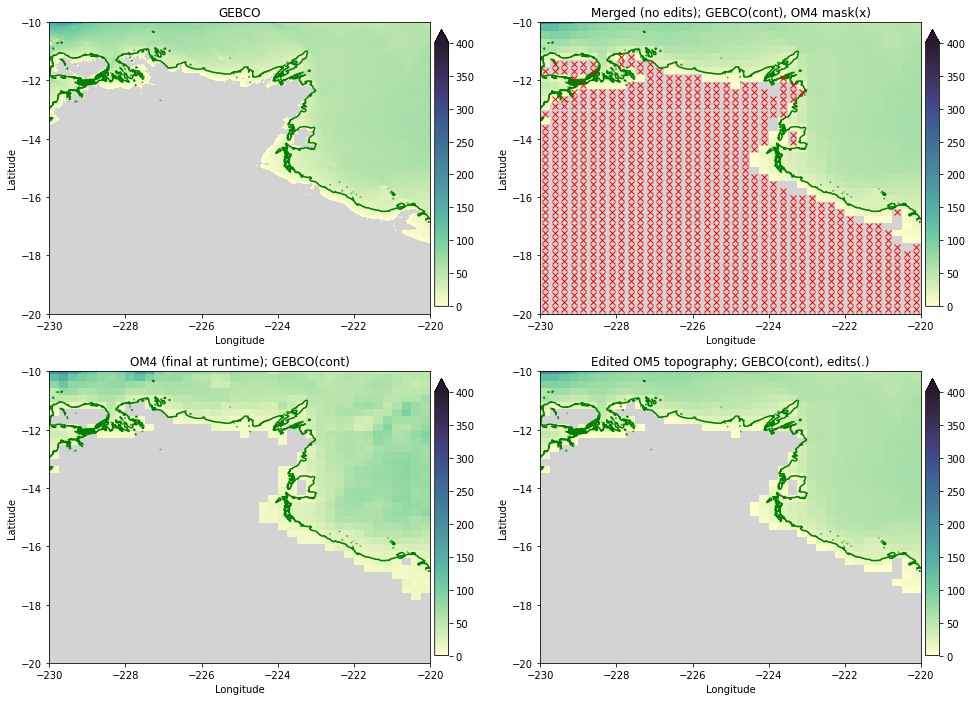

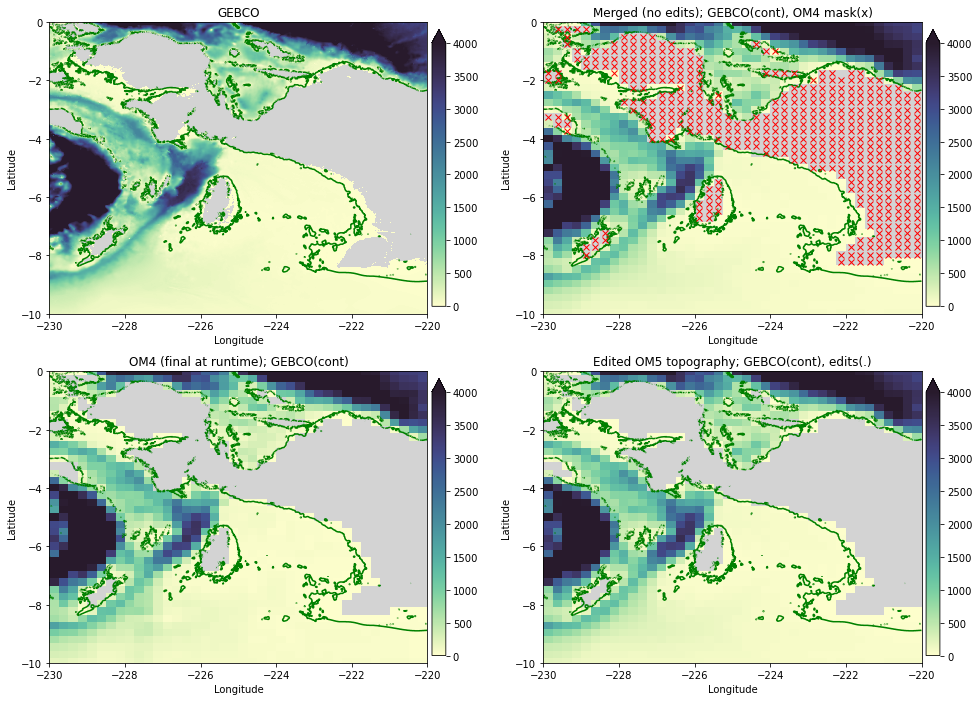

In [27]:
region = Region(-225, -25, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-225, -15, width_lon=10, width_lat=10)
map_region(region, 0, 400, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);

region = Region(-225, -5, width_lon=10, width_lat=10)
map_region(region, 0, 4000, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


Gebco (js:je,is:ie) = 18599:19799,17400:18600
OM4 model (js:je,is:ie) = 452:474,288:310
OM5 model (js:je,is:ie) = 533:555,288:310
Using xlim = (-227.5, -222.5) ylim = (-12.5, -7.5)


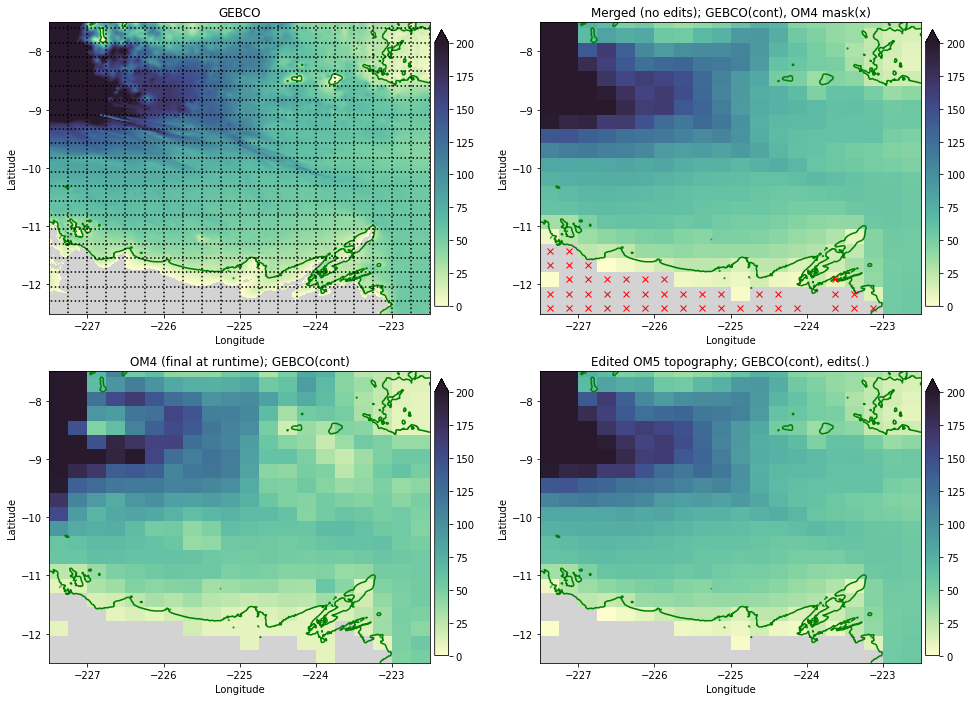

In [28]:
region = Region(-225, -10, width_lon=5, width_lat=5)
map_region(region, 0, 200, GEBCO, OM4, OM5, '', gebco_contours=[20],text_depths=False);


In [29]:
OM5.write_nc("om5_topo_edits_region_08.nc")

New Depth at jEdit=476 iEdit=215 set to 5.0
New Depth at jEdit=478 iEdit=214 set to 5.0
New Depth at jEdit=479 iEdit=215 set to 5.0
New Depth at jEdit=549 iEdit=236 set to 0.0
New Depth at jEdit=549 iEdit=238 set to 0.0
New Depth at jEdit=549 iEdit=249 set to 0.0
New Depth at jEdit=550 iEdit=249 set to 0.0
New Depth at jEdit=550 iEdit=252 set to 0.0
New Depth at jEdit=550 iEdit=254 set to 0.0
New Depth at jEdit=550 iEdit=255 set to 250.0
New Depth at jEdit=550 iEdit=256 set to 0.0
New Depth at jEdit=551 iEdit=254 set to 0.0
New Depth at jEdit=551 iEdit=256 set to 0.0
NetCDF file 'om5_topo_edits_region_08.nc' written successfully.
